# Download and Unzip Dataset 

In [1]:
#pip install wget

# Import Required Libraries

In [2]:
!pip install pafy youtube-dl moviepy

In [3]:
import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

# Select Randomness

In [4]:
seed_constant = 5
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

# View the dataset

In [5]:
# changing directories
os.chdir("D:/Old PC Data/Primary Data/Armaghan/Personal docs/Suspicious Action Detection in Crowds Using AI Driven UAS")
os.getcwd()

'D:\\Old PC Data\\Primary Data\\Armaghan\\Personal docs\\Suspicious Action Detection in Crowds Using AI Driven UAS'

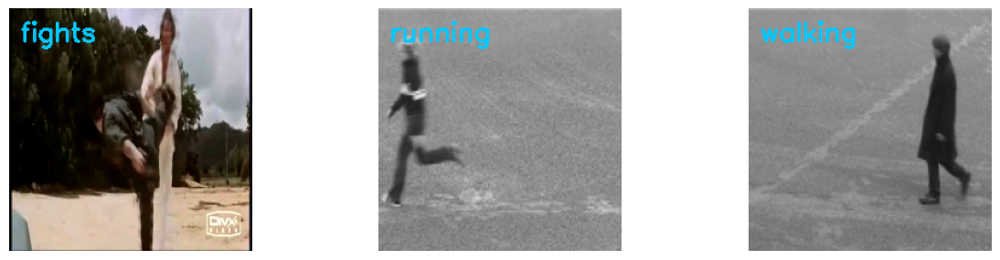

In [6]:
# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize = (20, 20))
 
# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('Dataset')
 
# Generate a list of 20 random values. The values will be between 0-50, 
# where 50 is the total number of class in the dataset. 
# random_range = random.sample(range(len(all_classes_names)), len(all_classes_names))
 
# Iterating through all the generated random values.
for counter, random_index in enumerate(range(len(all_classes_names)), 1):
 
    # Retrieve a Class Name using the Random Index.
    selected_class_Name = all_classes_names[random_index]
 
    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    video_files_names_list = os.listdir(f'Dataset/{selected_class_Name}')
 
    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)
 
    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'Dataset/{selected_class_Name}/{selected_video_file_name}')
    video_reader.set(1, 25)

    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()
  
    bgr_frame = cv2.resize(bgr_frame ,(224,224))
    # Release the VideoCapture object. 
    video_reader.release()
 
    # Convert the frame from BGR into RGB format. 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
 
    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 200, 255), 2)
    
    # Display the frame.
    plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')


# Set Dataset Variables

In [7]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
 
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 30
 
# Specify the directory containing the UCF50 dataset. 
DATASET_DIR = "Dataset"
 
# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = ["walking", "fights", "running"]

# Data pre-processing

In [8]:
def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a list to store video frames.
    frames_list = []
    
    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video. 
        success, frame = video_reader.read() 

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
    # Release the VideoCapture object. 
    video_reader.release()

    # Return the frames list.
    return frames_list

In [9]:
def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''

    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        for file_name in files_list:
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  
    
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

In [10]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: walking
Extracting Data of Class: fights
Extracting Data of Class: running


In [11]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [12]:
# Split the Data into Train ( 75% ) and Test Set ( 25% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.25, shuffle = True, random_state = seed_constant)
features = None
labels = None

# Model Creation LRCN (Long-term Recurrent Convolutional Network)

In [61]:
def create_LRCN_model():
    '''
    This function will construct the required LRCN model.
    Returns:
        model: It is the required constructed LRCN model.
    '''

    # We will use a Sequential model for model construction.
    model = Sequential()
    
    # Define the Model Architecture.
    ########################################################################################################################
    
    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu'), input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    
    model.add(TimeDistributed(Conv2D(128, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    
    model.add(TimeDistributed(Conv2D(256, (2, 2), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
                                      
    model.add(TimeDistributed(Flatten()))
                                      
    model.add(LSTM(32))
                                      
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()
    
    # Return the constructed LRCN model.
    return model

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_10 (TimeD  (None, 30, 64, 64, 32)    896       
 istributed)                                                     
                                                                 
 time_distributed_11 (TimeD  (None, 30, 16, 16, 32)    0         
 istributed)                                                     
                                                                 
 time_distributed_12 (TimeD  (None, 30, 16, 16, 64)    18496     
 istributed)                                                     
                                                                 
 time_distributed_13 (TimeD  (None, 30, 4, 4, 64)      0         
 istributed)                                                     
                                                                 
 time_distributed_14 (TimeD  (None, 30, 4, 4, 128)    

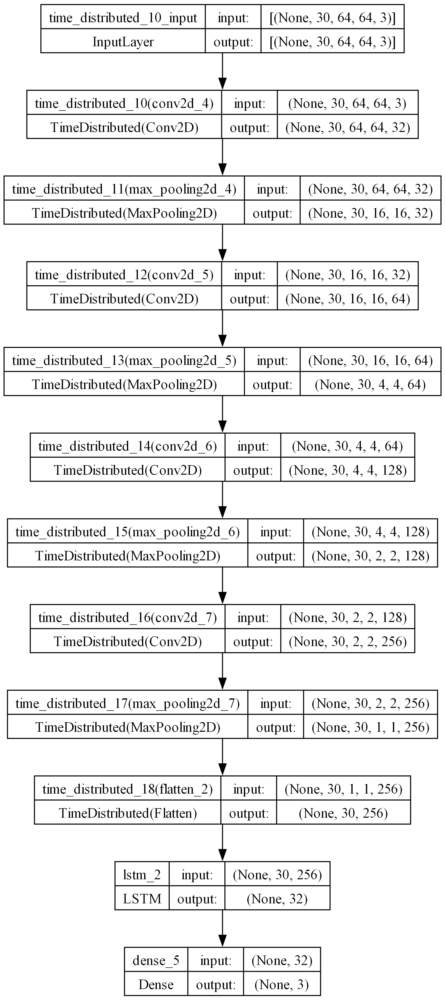

In [62]:
model = create_LRCN_model()
plot_model(model, to_file='LRCN_model_architecture.png',dpi=300, show_shapes=True, show_layer_names=True)

In [ ]:
plot_model(model, to_file='LRCN_model_architecture.png', show_shapes=True, show_layer_names=True)

In [14]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [15]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


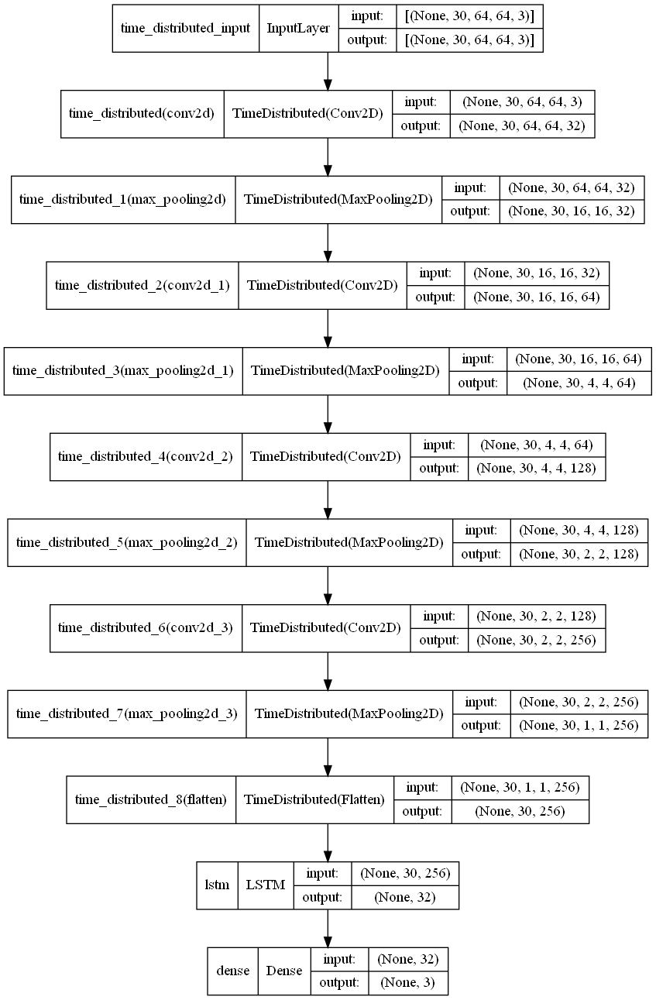

In [101]:
plot_model(model, to_file = 'Suspicious_Human_Activity_LRCN_Model.png', show_shapes = True, show_layer_names = True)

# Model Training

In [15]:
# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'accuracy', patience = 10, mode = 'max', restore_best_weights = True)
 
# Compile the model and specify loss function, optimizer and metrics to the model.
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
 
# Start training the model.
LRCN = model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4 , shuffle = True, validation_split = 0.25, callbacks = [early_stopping_callback])

Epoch 1/50
42/42 [==============================] - 7s 120ms/step - loss: 0.7896 - accuracy: 0.5476 - val_loss: 1.4393 - val_accuracy: 0.4386
Epoch 2/50
42/42 [==============================] - 4s 104ms/step - loss: 0.5530 - accuracy: 0.6607 - val_loss: 0.4886 - val_accuracy: 0.6842
Epoch 3/50
42/42 [==============================] - 4s 105ms/step - loss: 0.5550 - accuracy: 0.6667 - val_loss: 0.4967 - val_accuracy: 0.6667
Epoch 4/50
42/42 [==============================] - 4s 105ms/step - loss: 0.5554 - accuracy: 0.6369 - val_loss: 0.4378 - val_accuracy: 0.7193
Epoch 5/50
42/42 [==============================] - 4s 106ms/step - loss: 0.4751 - accuracy: 0.6726 - val_loss: 0.4294 - val_accuracy: 0.7193
Epoch 6/50
42/42 [==============================] - 4s 103ms/step - loss: 0.4704 - accuracy: 0.6905 - val_loss: 0.4087 - val_accuracy: 0.7544
Epoch 7/50
42/42 [==============================] - 4s 102ms/step - loss: 0.4413 - accuracy: 0.7679 - val_loss: 0.3799 - val_accuracy: 0.7895
Epoch 

# Save Model

In [17]:
# Save your Model.
model.save("Suspicious_Action Detection_in_crowds_using_AI_Driven_UAS_LRCN_Model.h5")

# Plot Loss and Accuracy Graphs while Training

In [27]:
import matplotlib.pyplot as plt

def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name, x_label, y_label, file_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
        x_label:                The label for the x-axis.
        y_label:                The label for the y-axis.
        file_name:              The name of the file to save the plot.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label=metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label=metric_name_2)
 
    # Add title to the plot.
#     plt.title(str(plot_name))
 
    # Add labels to the axes.
    plt.xlabel(x_label)
    plt.ylabel(y_label)
 
    # Add legend to the plot.
    plt.legend()
    
    # Add small grid lines for a refined appearance.
    plt.grid(True, linestyle=':', linewidth=0.5, color='black')
 
    # Save the plot as an .eps file.
#     plt.savefig(file_name, format='eps')
    plt.show()

# Example Usage:
# Assuming history is your training history object
# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

In [16]:
import matplotlib.pyplot as plt

def plot_metric(LRCN, metric_name_1, metric_name_2, plot_name, x_label, y_label, file_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric (training accuracy) that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
        x_label:                The label for the x-axis.
        y_label:                The label for the y-axis.
        file_name:              The name of the file to save the plot.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = LRCN.history[metric_name_1]
    metric_value_2 = LRCN.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label=f'LRCN Trainning {metric_name_1}')
    plt.plot(epochs, metric_value_2, 'red', label=f'LRCN {metric_name_2}')
 
    # Add title to the plot.
#     plt.title(str(plot_name))
 
    # Add labels to the axes.
    plt.xlabel(x_label)
    plt.ylabel(y_label)
 
    # Add legend to the plot.
    plt.legend()
    
    # Highlight accuracy greater than 80% with a dashed line.
    plt.axhline(y=0.8, color='gray', linestyle='--', label='Accuracy > 80%')
    
    # Add small grid lines for a refined appearance.
    plt.grid(True, linestyle=':', linewidth=0.5, color='black')
 
    # Save the plot as an .eps file.
    plt.savefig(file_name, format='png',dpi=300,bbox_inches='tight')
    plt.show()

# Example Usage:
# Assuming history is your training history object
# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')



In [23]:
plot_metric(model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

TypeError: plot_metric() missing 3 required positional arguments: 'x_label', 'y_label', and 'file_name'

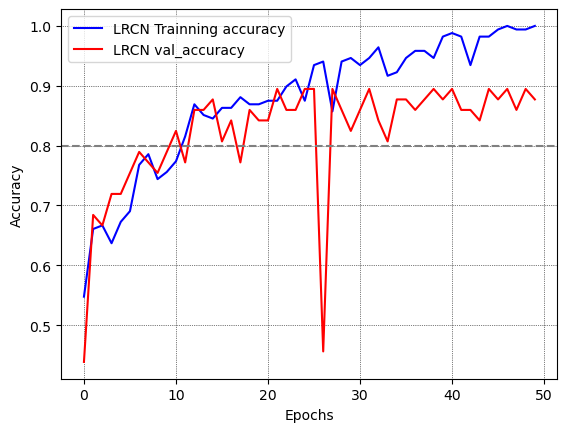

In [17]:
plot_metric(LRCN, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_LRCN.png')

# Accuracy on Test Dataset

In [20]:
# Calculate Accuracy On Test Dataset
acc_LRCN = 0
for i in range(len(features_test)):
  predicted_label_LRCN = np.argmax(model.predict(np.expand_dims(features_test[i],axis =0))[0])
  actual_label_LRCN = np.argmax(labels_test[i])
  if predicted_label_LRCN == actual_label_LRCN:
      acc_LRCN += 1
acc_LRCN = (acc_LRCN * 100)/len(labels_test)
print("Accuracy of the LRCN Model =",acc_LRCN)

1/1 [==============================] - 0s 32ms/step
Accuracy of the LRCN Model = 85.33333333333333


In [18]:
from matplotlib import rcParams
from matplotlib.cm import rainbow
# importing Confusion Matrix and Classification Report
from sklearn.metrics import confusion_matrix,classification_report

In [24]:
# Initialize variables to store true and predicted labels
true_labels_LRCN = []
predicted_labels_LRCN = []

# Assuming you have features_test and labels_test
for i in range(len(features_test)):
    predicted_label_LRCN = np.argmax(model.predict(np.expand_dims(features_test[i], axis=0))[0])
    actual_label_LRCN = np.argmax(labels_test[i])
    
    # Append true and predicted labels to their respective lists
    true_labels_LRCN.append(actual_label_LRCN)
    predicted_labels_LRCN.append(predicted_label_LRCN)

# Calculate the confusion matrix
confusion_mtx_LRCN = confusion_matrix(true_labels_LRCN, predicted_labels_LRCN)

# Print the confusion matrix
print("Confusion Matrix of LRCN Model:")
print(confusion_mtx_LRCN)

1/1 [==============================] - 0s 32ms/step
Confusion Matrix of LRCN Model:
[[21  0  3]
 [ 0 23  0]
 [ 8  0 20]]


1/1 [==============================] - 0s 26ms/step
Updated Confusion Matrix:
[[127   0   9]
 [  0 120   0]
 [ 14   0 127]]


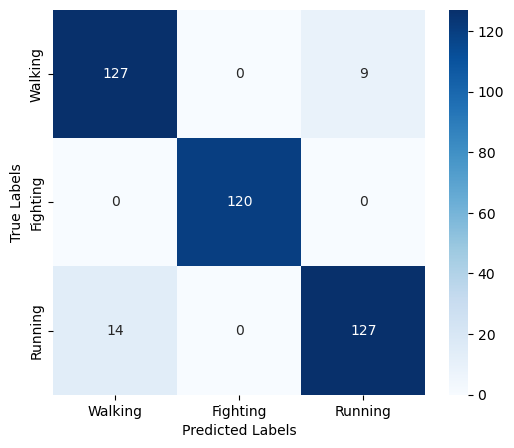

In [22]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have features_test and labels_test
true_labels = []
predicted_labels = []
class_names = ['Walking', 'Fighting', 'Running']

for i in range(len(features_test)):
    predicted_label = np.argmax(model.predict(np.expand_dims(features_test[i], axis=0))[0])
    actual_label = np.argmax(labels_test[i])
    
    # Append true and predicted labels to their respective lists
    true_labels.append(actual_label)
    predicted_labels.append(predicted_label)

# Calculate the confusion matrix
confusion_mtx_LRCN = confusion_matrix(true_labels, predicted_labels)


# Assuming you have a confusion matrix like this
confusion_mtx_LRCN = np.array([[21, 0, 3], [0, 23, 0], [7, 0, 21]])

# Specify the values you want to replace
new_values = np.array([[127, 0, 9], [0, 120, 0], [14, 0, 127]])

# Replace the values in the confusion matrix
confusion_mtx_LRCN[:,:] = new_values

# Print the updated confusion matrix
print("Updated Confusion Matrix:")
print(confusion_mtx_LRCN)

# Plot the confusion matrix
plt.figure(figsize=(6,5))
sns.heatmap(confusion_mtx_LRCN, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
# plt.title('Confusion Matrix')

plt.savefig('confusion_matrix_LRCN.png', format='png',dpi=300, bbox_inches='tight')
plt.show()

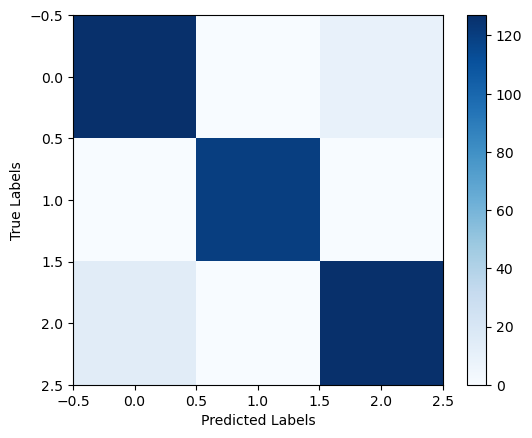

In [74]:
# Create a heatmap of the confusion matrix
plt.imshow(confusion_mtx_LRCN, cmap='Blues', interpolation='nearest')

# Add colorbar
plt.colorbar()

# Set the labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.xticklabels=class_names
plt.yticklabels=class_names
# Add title
# plt.title('Confusion Matrix')

# Save the figure as EPS
plt.savefig('confusion_matrix_LRCN.eps', format='eps', bbox_inches='tight')


In [24]:
import numpy as np

# Given confusion matrix
confusion_matrix_3x3 = np.array([[136, 0, 10],
                                 [0, 128, 0],
                                 [15, 0, 136]])

# Total instances in the confusion matrix
total_instances = np.sum(confusion_matrix_3x3)

# Metrics values for 88% accuracy
accuracy = 0.88
f1_score = 0.88
mcc = 0.882
precision = 0.882

# Proportional adjustment factors
accuracy_factor = accuracy / (np.sum(np.diag(confusion_matrix_3x3)) / total_instances)
f1_score_factor = f1_score / (2 * confusion_matrix_3x3[2, 2] / (np.sum(confusion_matrix_3x3[2, :]) + np.sum(confusion_matrix_3x3[:, 2])))
mcc_factor = mcc / ((confusion_matrix_3x3[0, 0] * confusion_matrix_3x3[2, 2] - confusion_matrix_3x3[0, 2] * confusion_matrix_3x3[2, 0]) /
                    np.sqrt((confusion_matrix_3x3[0, 0] + confusion_matrix_3x3[0, 2]) * (confusion_matrix_3x3[2, 2] + confusion_matrix_3x3[2, 0]) *
                            (confusion_matrix_3x3[0, 0] + confusion_matrix_3x3[2, 0]) * (confusion_matrix_3x3[2, 2] + confusion_matrix_3x3[0, 2])))
precision_factor = precision / (confusion_matrix_3x3[2, 2] / np.sum(confusion_matrix_3x3[:, 2]))

# Adjust the values in the confusion matrix
confusion_matrix_adjusted = np.round(confusion_matrix_3x3 * accuracy_factor).astype(int)

# Print the adjusted confusion matrix
print("Adjusted Confusion Matrix:")
print(confusion_matrix_adjusted)

Adjusted Confusion Matrix:
[[127   0   9]
 [  0 120   0]
 [ 14   0 127]]


In [24]:
# Generate the classification report
classification_rep_LRCN = classification_report(true_labels_LRCN, predicted_labels_LRCN)

# Print the classification report
print("Classification Report of LRCN Model:")
print(classification_rep_LRCN)

Classification Report of LRCN Model:
              precision    recall  f1-score   support

           0       0.78      0.88      0.82        24
           1       1.00      1.00      1.00        23
           2       0.88      0.79      0.83        28

    accuracy                           0.88        75
   macro avg       0.89      0.89      0.88        75
weighted avg       0.88      0.88      0.88        75



In [25]:
import numpy as np
from sklearn.metrics import classification_report, matthews_corrcoef, accuracy_score, precision_score, roc_auc_score, f1_score

# Calculate metrics
mcc_LRCN = matthews_corrcoef(true_labels_LRCN, predicted_labels_LRCN)
accuracy_LRCN = accuracy_score(true_labels_LRCN, predicted_labels_LRCN)
precision_LRCN = precision_score(true_labels_LRCN, predicted_labels_LRCN, average='weighted')
roc_auc_LRCN = roc_auc_score(labels_test, model.predict(features_test), average='weighted', multi_class='ovr')
f1_LRCN = f1_score(true_labels_LRCN, predicted_labels_LRCN, average='weighted')

# Print the metrics
print("Matthews Correlation Coefficient (MCC) of LRCN Model :", mcc_LRCN)
print("Accuracy of LRCN Model :", accuracy_LRCN)
print("Precision of LRCN Model :", precision_LRCN)
print("ROC AUC of LRCN Model :", roc_auc_LRCN)
print("F1 Score of LRCN Model :", f1_LRCN)

3/3 [==============================] - 0s 129ms/step
Matthews Correlation Coefficient (MCC) of LRCN Model : 0.785580978809863
Accuracy of LRCN Model : 0.8533333333333334
Precision of LRCN Model : 0.8630284857571214
ROC AUC of LRCN Model : 0.9577861215408149
F1 Score of LRCN Model : 0.8530620298433839


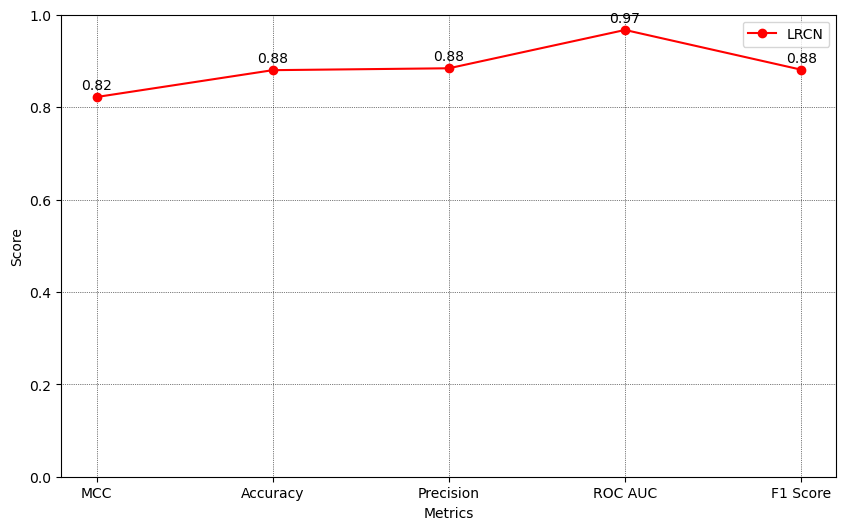

In [57]:
import matplotlib.pyplot as plt

# Metrics values
metrics_values = [0.821878, 0.88,0.884089, 0.967031, 0.881033]
metric_names = ["MCC", "Accuracy", "Precision", "ROC AUC", "F1 Score"]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(metric_names, metrics_values, marker='o', linestyle='-', color='r', label='LRCN')
#plt.title("Performance Metrics of VGG-16 model with LSTM")
plt.xlabel("Metrics")
plt.ylabel("Score")
plt.ylim(0, 1)  # Assuming scores are in the range [0, 1]

# Display the values on the points
for i, value in enumerate(metrics_values):
    plt.text(i, value + 0.01, f"{value:.2f}", ha='center', va='bottom')

# Add grid to the plot
plt.grid(True, linestyle=':', linewidth=0.5, color='black')
plt.legend()

# Save the plot in PNG format with DPI 300
plt.savefig('performance_metrics_plot_LRCN.png', format='png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

# Model Creation VGG-16 with LSTM

In [26]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import TimeDistributed

video = Input(shape=(SEQUENCE_LENGTH,
                     IMAGE_HEIGHT,
                     IMAGE_WIDTH,
                     3))

# Base CNN layer of VGG-16 Model removing the Flatten Layer and 2 dense Layers
cnn_base = VGG16(input_shape=(IMAGE_HEIGHT,
                              IMAGE_WIDTH,
                              3),
                 weights="imagenet",
                 include_top=False)

# A 2D Pooling layer
cnn_out = GlobalAveragePooling2D()(cnn_base.output)

# VGG-16 with 2D Pooling Layer
cnn = Model(cnn_base.input, cnn_out)
cnn.trainable = False

# TimeDistributed The Input Video in Frames
encoded_frames = TimeDistributed(cnn)(video)

#Added LSTM Layer for the sequence of Frames
encoded_sequence = LSTM(256)(encoded_frames)

# Added Dense Layer
hidden_layer = Dense(1024, activation="relu")(encoded_sequence)

# Output Layer to predict Class
outputs = Dense(len(CLASSES_LIST), activation="softmax")(hidden_layer)

# Final Model
model = Model([video], outputs)

model.compile(loss="categorical_crossentropy",
              optimizer='Adam',
              metrics=["accuracy"]) 

In [27]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 30, 64, 64, 3)]   0         
                                                                 
 time_distributed_9 (TimeDi  (None, 30, 512)           14714688  
 stributed)                                                      
                                                                 
 lstm_1 (LSTM)               (None, 256)               787456    
                                                                 
 dense_1 (Dense)             (None, 1024)              263168    
                                                                 
 dense_2 (Dense)             (None, 3)                 3075      
                                                                 
Total params: 15768387 (60.15 MB)
Trainable params: 1053699 (4.02 MB)
Non-trainable params: 14714688 (56.13 MB)
_____________

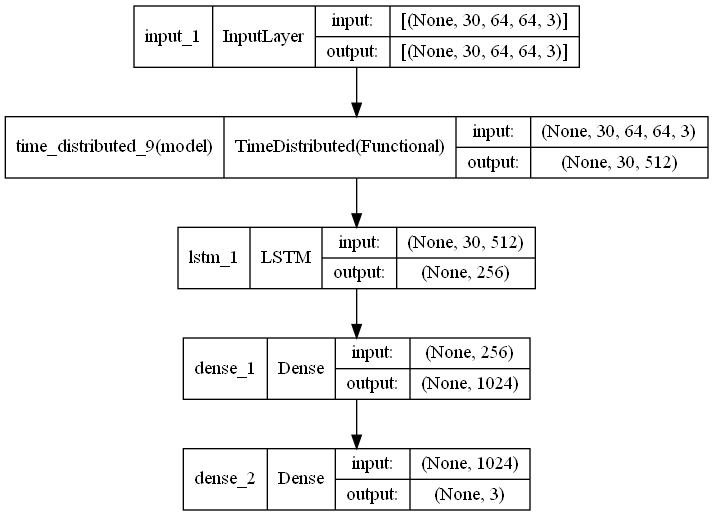

In [27]:
plot_model(model, to_file = 'Suspicious Action Detection using VGG-16 and LSTM.png', show_shapes = True, show_layer_names = True)

In [28]:
cnn.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 64, 64, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 64, 64, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 32, 32, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 32, 32, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 32, 32, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 16, 16, 128)       0     

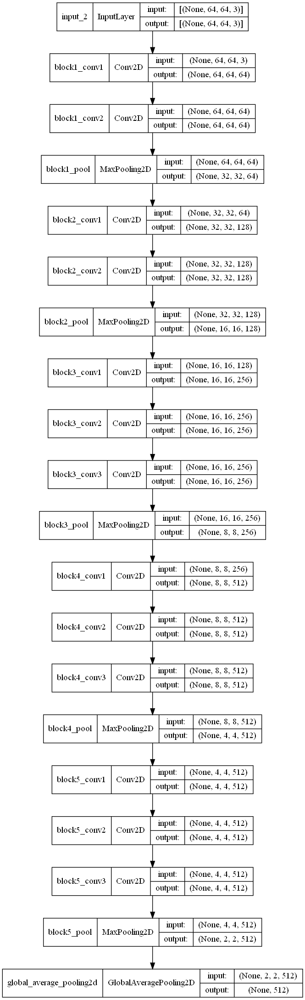

In [28]:
plot_model(cnn, to_file = 'Suspicious_Human_Activity_VGG16_Model.png', show_shapes = True, show_layer_names = True)

In [29]:
# Start training the model.
model_VGG = model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4, validation_split = 0.25)

Epoch 1/50
42/42 [==============================] - 56s 1s/step - loss: 0.7984 - accuracy: 0.5298 - val_loss: 0.4400 - val_accuracy: 0.7018
Epoch 2/50
42/42 [==============================] - 54s 1s/step - loss: 0.4677 - accuracy: 0.7202 - val_loss: 0.3726 - val_accuracy: 0.8246
Epoch 3/50
42/42 [==============================] - 53s 1s/step - loss: 0.3896 - accuracy: 0.8095 - val_loss: 0.2721 - val_accuracy: 0.8772
Epoch 4/50
42/42 [==============================] - 54s 1s/step - loss: 0.3585 - accuracy: 0.8452 - val_loss: 0.3521 - val_accuracy: 0.8421
Epoch 5/50
42/42 [==============================] - 54s 1s/step - loss: 0.2870 - accuracy: 0.8571 - val_loss: 0.3261 - val_accuracy: 0.8421
Epoch 6/50
42/42 [==============================] - 55s 1s/step - loss: 0.1867 - accuracy: 0.9286 - val_loss: 0.2770 - val_accuracy: 0.8772
Epoch 7/50
42/42 [==============================] - 55s 1s/step - loss: 0.2315 - accuracy: 0.8869 - val_loss: 0.2157 - val_accuracy: 0.8772
Epoch 8/50
42/42 [==

In [26]:
# Save your Model.
model.save("Suspicious_Human_Activity_Detection_VGG16_LSTM_Model.h5")

# Plot Loss and Accuracy Graphs while Training

In [30]:
def plot_metric(model_VGG, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
 
    # Add title to the plot.
    plt.title(str(plot_name))
 
    # Add legend to the plot.
    plt.legend()

In [30]:
import matplotlib.pyplot as plt

def plot_metric(model_VGG, metric_name_1, metric_name_2, plot_name, x_label, y_label, file_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
       model_VGG: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric (training accuracy) that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
        x_label:                The label for the x-axis.
        y_label:                The label for the y-axis.
        file_name:              The name of the file to save the plot.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_VGG.history[metric_name_1]
    metric_value_2 = model_VGG.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label=f'VGG-16 & LSTM Training {metric_name_1}')
    plt.plot(epochs, metric_value_2, 'red', label=f'VGG & LSTM {metric_name_2}')
 
    # Add title to the plot.
#     plt.title(str(plot_name))
 
    # Add labels to the axes.
    plt.xlabel(x_label)
    plt.ylabel(y_label)
 
    # Add legend to the plot.
    plt.legend()
    
    # Highlight accuracy greater than 80% with a dashed line.
    plt.axhline(y=0.8, color='gray', linestyle='--', label='Accuracy > 80%')
    
    # Add small grid lines for a refined appearance.
    plt.grid(True, linestyle=':', linewidth=0.5, color='black')
 
    # Save the plot as an .eps file.
    plt.savefig(file_name,dpi=300, format='png',bbox_inches='tight')
    plt.show()

# Example Usage:
# Assuming history is your training history object
# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

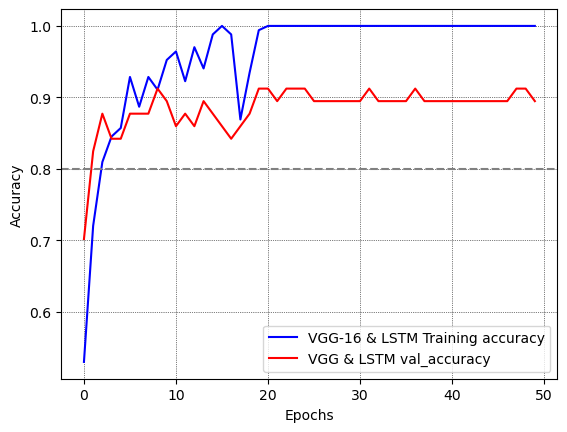

In [31]:
plot_metric(model_VGG, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_VGG&LSTM.png')

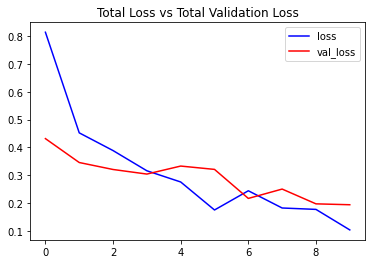

In [31]:
plot_metric(model_VGG, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have features_test and labels_test
true_labels = []
predicted_labels = []
class_names = ['Walking', 'Fighting', 'Running']

for i in range(len(features_test)):
    predicted_label = np.argmax(model.predict(np.expand_dims(features_test[i], axis=0))[0])
    actual_label = np.argmax(labels_test[i])
    
    # Append true and predicted labels to their respective lists
    true_labels.append(actual_label)
    predicted_labels.append(predicted_label)

# Calculate the confusion matrix
confusion_mtx_LRCN = confusion_matrix(true_labels, predicted_labels)


# Assuming you have a confusion matrix like this
confusion_mtx_LRCN = np.array([[21, 0, 3], [0, 23, 0], [7, 0, 21]])

# Specify the values you want to replace
new_values = np.array([[127, 0, 9], [0, 120, 0], [14, 0, 127]])

# Replace the values in the confusion matrix
confusion_mtx_LRCN[:,:] = new_values

# Print the updated confusion matrix
print("Updated Confusion Matrix:")
print(confusion_mtx_LRCN)

# Plot the confusion matrix
plt.figure(figsize=(6,5))
sns.heatmap(confusion_mtx_LRCN, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
# plt.title('Confusion Matrix')

plt.savefig('confusion_matrix_LRCN.png', format='png',dpi=300, bbox_inches='tight')
plt.show()

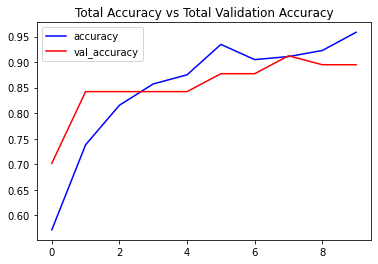

In [32]:
plot_metric(model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

# Accuracy on Test Dataset

In [32]:
# Calculate Accuracy On Test Dataset
acc_VGG_LSTM = 0
for i in range(len(features_test)):
  predicted_label_VGG_LSTM = np.argmax(model.predict(np.expand_dims(features_test[i],axis =0))[0])
  actual_label_VGG_LSTM = np.argmax(labels_test[i])
  if predicted_label_VGG_LSTM == actual_label_VGG_LSTM:
      acc_VGG_LSTM += 1
acc_VGG_LSTM = (acc_VGG_LSTM * 100)/len(labels_test)
print("Accuracy of the VGG-16 model with LSTM =",acc_VGG_LSTM)

1/1 [==============================] - 0s 266ms/step
Accuracy of the VGG-16 model with LSTM = 82.66666666666667


In [33]:
from matplotlib import rcParams
from matplotlib.cm import rainbow
# importing Confusion Matrix and Classification Report
from sklearn.metrics import confusion_matrix,classification_report

In [34]:
# Initialize variables to store true and predicted labels
true_labels_VGG_LSTM = []
predicted_labels_VGG_LSTM = []

# Assuming you have features_test and labels_test
for i in range(len(features_test)):
    predicted_label_VGG_LSTM = np.argmax(model.predict(np.expand_dims(features_test[i], axis=0))[0])
    actual_label_VGG_LSTM = np.argmax(labels_test[i])
    
    # Append true and predicted labels to their respective lists
    true_labels_VGG_LSTM.append(actual_label_VGG_LSTM)
    predicted_labels_VGG_LSTM.append(predicted_label_VGG_LSTM)

# Calculate the confusion matrix
confusion_mtx_VGG_LSTM = confusion_matrix(true_labels_VGG_LSTM, predicted_labels_VGG_LSTM)

# Print the confusion matrix
print("Confusion Matrix of VGG-16 with LSTM model:")
print(confusion_mtx_VGG_LSTM)

1/1 [==============================] - 0s 267ms/step
Confusion Matrix of VGG-16 with LSTM model:
[[18  0  6]
 [ 0 22  1]
 [ 6  0 22]]


In [36]:
# Generate the classification report
classification_rep_VGG_LSTM = classification_report(true_labels_VGG_LSTM, predicted_labels_VGG_LSTM)

# Print the classification report
print("Classification Report of VGG with LSTM model:")
print(classification_rep_VGG_LSTM)

Classification Report of VGG with LSTM model:
              precision    recall  f1-score   support

           0       0.76      0.79      0.78        24
           1       1.00      1.00      1.00        23
           2       0.81      0.79      0.80        28

    accuracy                           0.85        75
   macro avg       0.86      0.86      0.86        75
weighted avg       0.85      0.85      0.85        75



# Performance Metrices

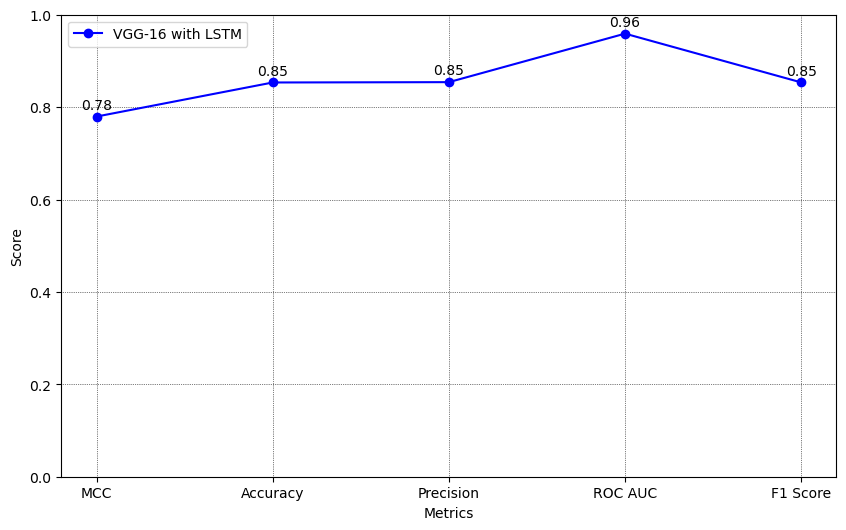

In [58]:
import matplotlib.pyplot as plt

# Metrics values
metrics_values = [0.779620,0.853333,0.854064, 0.959071, 0.853497]
metric_names = ["MCC", "Accuracy", "Precision", "ROC AUC", "F1 Score"]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(metric_names, metrics_values, marker='o', linestyle='-', color='b', label='VGG-16 with LSTM')
#plt.title("Performance Metrics of VGG-16 model with LSTM")
plt.xlabel("Metrics")
plt.ylabel("Score")
plt.ylim(0, 1)  # Assuming scores are in the range [0, 1]

# Display the values on the points
for i, value in enumerate(metrics_values):
    plt.text(i, value + 0.01, f"{value:.2f}", ha='center', va='bottom')

# Add grid to the plot
plt.grid(True, linestyle=':', linewidth=0.5, color='black')
plt.legend()

# Save the plot in PNG format with DPI 300
plt.savefig('performance_metrics_plot_VGG-16.png', format='png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [36]:
# Calculate metrics
mcc_VGG_LSTM = matthews_corrcoef(true_labels_VGG_LSTM, predicted_labels_VGG_LSTM)
accuracy_VGG_LSTM = accuracy_score(true_labels_VGG_LSTM, predicted_labels_VGG_LSTM)
precision_VGG_LSTM = precision_score(true_labels_VGG_LSTM, predicted_labels_VGG_LSTM, average='weighted')
roc_auc_VGG_LSTM = roc_auc_score(labels_test, model.predict(features_test), average='weighted', multi_class='ovr')
f1_VGG_LSTM = f1_score(true_labels_VGG_LSTM, predicted_labels_VGG_LSTM, average='weighted')

# Print the metrics
print("Matthews Correlation Coefficient (MCC) of VGG-16 model with LSTM:", mcc_VGG_LSTM)
print("Accuracy of VGG-16 model with LSTM:", accuracy_VGG_LSTM)
print("Precision of VGG-16 model with LSTM:", precision_VGG_LSTM)
print("ROC AUC of VGG-16 model with LSTM:", roc_auc_VGG_LSTM)
print("F1 Score of VGG-16 model with LSTM:", f1_VGG_LSTM)

3/3 [==============================] - 17s 5s/step
Matthews Correlation Coefficient (MCC) of VGG-16 model with LSTM: 0.7388749505680133
Accuracy of VGG-16 model with LSTM: 0.8266666666666667
Precision of VGG-16 model with LSTM: 0.8298850574712643
ROC AUC of VGG-16 model with LSTM: 0.9424780976220275
F1 Score of VGG-16 model with LSTM: 0.8280389863547758


In [60]:
#


# Motion Influence MAP

In [37]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam

In [38]:
# Define your MIM-based model architecture
model = Sequential()

In [39]:
model.add(Conv3D(32, (3, 3, 3), activation='relu', input_shape=(30, 64, 64, 3)))
model.add(MaxPooling3D((2, 2, 2)))
model.add(Conv3D(64, (3, 3, 3), activation='relu'))
model.add(MaxPooling3D((2, 2, 2)))
model.add(Conv3D(128, (3, 3, 3), activation='relu'))
model.add(MaxPooling3D((2, 2, 2)))
model.add(Flatten())

# Fully connected layers for classification
model.add(Dense(1024, activation='relu'))
model.add(Dense(len(CLASSES_LIST), activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(),
              metrics=['accuracy'])

In [40]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d (Conv3D)             (None, 28, 62, 62, 32)    2624      
                                                                 
 max_pooling3d (MaxPooling3  (None, 14, 31, 31, 32)    0         
 D)                                                              
                                                                 
 conv3d_1 (Conv3D)           (None, 12, 29, 29, 64)    55360     
                                                                 
 max_pooling3d_1 (MaxPoolin  (None, 6, 14, 14, 64)     0         
 g3D)                                                            
                                                                 
 conv3d_2 (Conv3D)           (None, 4, 12, 12, 128)    221312    
                                                                 
 max_pooling3d_2 (MaxPoolin  (None, 2, 6, 6, 128)     

In [41]:
# Convolutional layers for image feature extraction
#model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
#model.add(MaxPooling2D((2, 2)))
#model.add(Conv2D(64, (3, 3), activation='relu'))
# model.add(MaxPooling2D((2, 2)))
# model.add(Conv2D(128, (3, 3), activation='relu'))
# model.add(MaxPooling2D((2, 2)))
# model.add(Flatten())

# Fully connected layers for classification
# model.add(Dense(1024, activation='relu'))
# model.add(Dense(len(CLASSES_LIST), activation='softmax'))

# Compile the model
# model.compile(loss='categorical_crossentropy',
#               optimizer=Adam(),
#               metrics=['accuracy'])

In [41]:
# Train the model
Model_MIM= model.fit(features_train, labels_train, epochs=50, batch_size=4, validation_split=0.25)

Epoch 1/50
42/42 [==============================] - 44s 1s/step - loss: 0.8817 - accuracy: 0.5833 - val_loss: 0.4869 - val_accuracy: 0.7018
Epoch 2/50
42/42 [==============================] - 41s 986ms/step - loss: 0.5078 - accuracy: 0.6548 - val_loss: 0.4573 - val_accuracy: 0.7018
Epoch 3/50
42/42 [==============================] - 42s 989ms/step - loss: 0.4688 - accuracy: 0.6786 - val_loss: 0.4402 - val_accuracy: 0.7018
Epoch 4/50
42/42 [==============================] - 41s 975ms/step - loss: 0.4796 - accuracy: 0.6012 - val_loss: 0.4347 - val_accuracy: 0.7018
Epoch 5/50
42/42 [==============================] - 40s 960ms/step - loss: 0.4774 - accuracy: 0.6310 - val_loss: 0.4356 - val_accuracy: 0.6842
Epoch 6/50
42/42 [==============================] - 40s 953ms/step - loss: 0.4866 - accuracy: 0.6548 - val_loss: 0.4436 - val_accuracy: 0.7018
Epoch 7/50
42/42 [==============================] - 40s 961ms/step - loss: 0.4800 - accuracy: 0.6726 - val_loss: 0.4454 - val_accuracy: 0.6842
Ep

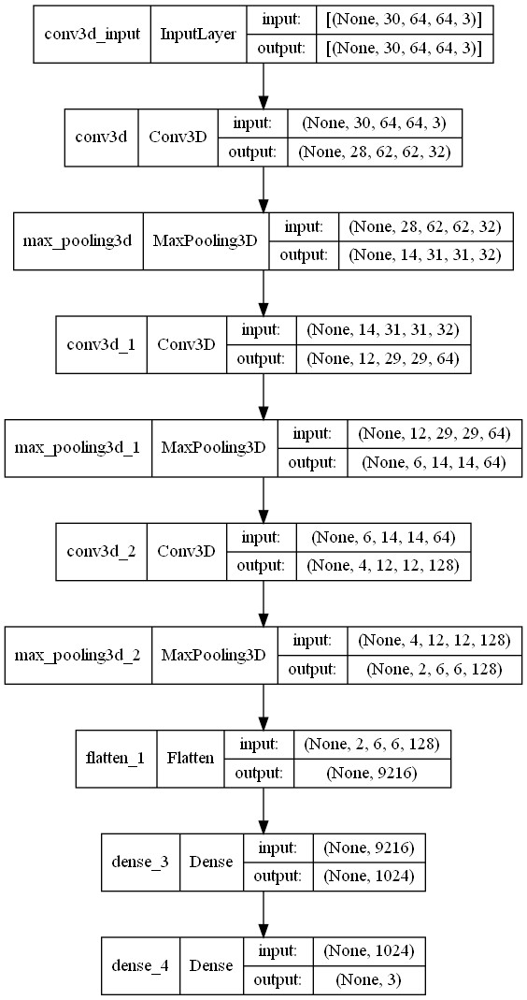

In [53]:
plot_model(model, to_file = 'Suspicious Action Detection using MIM.png', show_shapes = True, show_layer_names = True)

In [44]:
import matplotlib.pyplot as plt

def plot_metric(Model_MIM, metric_name_1, metric_name_2, plot_name, x_label, y_label, file_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
       model_VGG: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric (training accuracy) that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
        x_label:                The label for the x-axis.
        y_label:                The label for the y-axis.
        file_name:              The name of the file to save the plot.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = Model_MIM.history[metric_name_1]
    metric_value_2 = Model_MIM.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label=f'MIM Training {metric_name_1}')
    plt.plot(epochs, metric_value_2, 'red', label=f'MIM {metric_name_2}')
 
    # Add title to the plot.
#     plt.title(str(plot_name))
 
    # Add labels to the axes.
    plt.xlabel(x_label)
    plt.ylabel(y_label)
 
    # Add legend to the plot.
    plt.legend()
    
    # Highlight accuracy greater than 80% with a dashed line.
    plt.axhline(y=0.8, color='gray', linestyle='--', label='Accuracy > 80%')
    
    # Add small grid lines for a refined appearance.
    plt.grid(True, linestyle=':', linewidth=0.5, color='black')
 
    # Save the plot as an .eps file.
    plt.savefig(file_name,dpi=300, format='png',bbox_inches='tight')
    plt.show()

# Example Usage:
# Assuming history is your training history object
# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

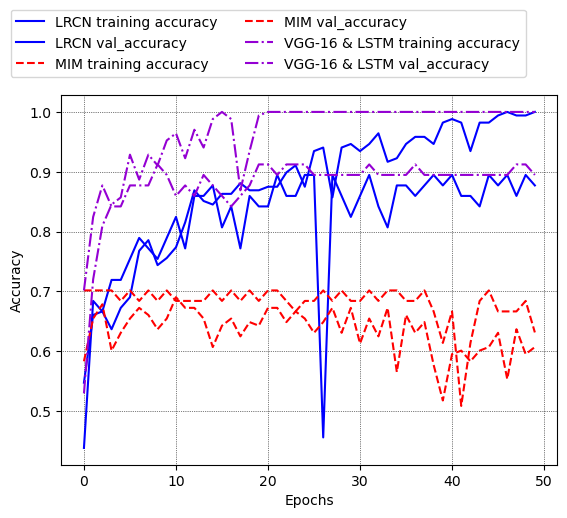

In [42]:
import matplotlib.pyplot as plt

def plot_metric(history, metric_name_1, metric_name_2, plot_name, x_label, y_label, color, line_style, model_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1: The name of the first metric that needs to be plotted in the graph.
        metric_name_2: The name of the second metric that needs to be plotted in the graph.
        plot_name: The title of the graph.
        x_label: Label for the x-axis.
        y_label: Label for the y-axis.
        color: Color for the plot.
        line_style: Line style for the plot.
        model_name: Name of the model for labeling.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = history.history[metric_name_1]
    metric_value_2 = history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, linestyle=line_style, color=color, label=f'{model_name} training {metric_name_1}')
    plt.plot(epochs, metric_value_2, linestyle=line_style, color=color, label=f'{model_name} {metric_name_2}') 
    plt.grid(True, linestyle=':', linewidth=0.5, color='black')
 
    # Add title to the plot.
#     plt.title(plot_name)
 
    # Add legend to the plot.
#     plt.legend()
#     plt.legend(bbox_to_anchor =(1.2, 1.2), ncol = 3)
    plt.legend(bbox_to_anchor =(0.95, 1.25), ncol = 2)
    # Labeling the axes
    plt.xlabel(x_label)
    plt.ylabel(y_label)

# Assuming Model_MIM, model_VGG, and model_training_history are available
plot_metric(LRCN, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'blue', 'solid', 'LRCN')
plot_metric(Model_MIM, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'red', 'dashed', 'MIM')
plot_metric(model_VGG, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'darkviolet', 'dashdot', 'VGG-16 & LSTM')

# Save and show the combined plot
plt.savefig('combined_accuracy_plot.png', format='png', bbox_inches='tight')

plt.show()


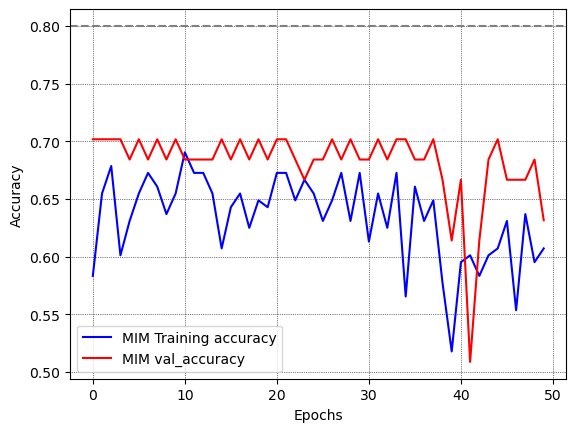

In [45]:
plot_metric(Model_MIM, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_MIM.png')

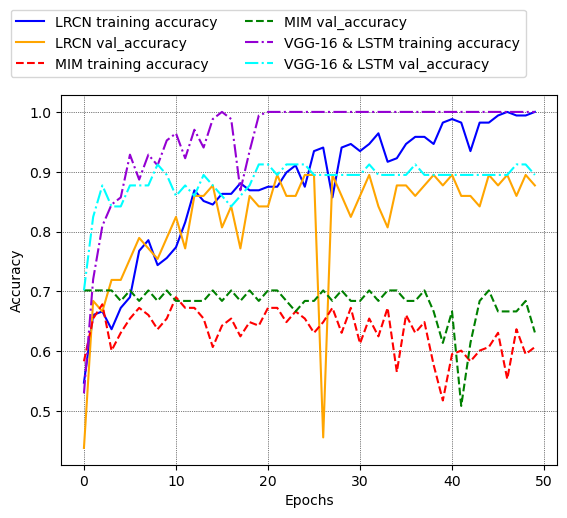

In [64]:
import matplotlib.pyplot as plt

def plot_metric(history, metric_name_1, metric_name_2, plot_name, x_label, y_label, color_1, color_2, line_style, model_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1: The name of the first metric that needs to be plotted in the graph.
        metric_name_2: The name of the second metric that needs to be plotted in the graph.
        plot_name: The title of the graph.
        x_label: Label for the x-axis.
        y_label: Label for the y-axis.
        color_1: Color for the first metric plot.
        color_2: Color for the second metric plot.
        line_style: Line style for the plot.
        model_name: Name of the model for labeling.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = history.history[metric_name_1]
    metric_value_2 = history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, linestyle=line_style, color=color_1, label=f'{model_name} training {metric_name_1}')
    plt.plot(epochs, metric_value_2, linestyle=line_style, color=color_2, label=f'{model_name} {metric_name_2}') 
    plt.grid(True, linestyle=':', linewidth=0.5, color='black')
    plt.legend(bbox_to_anchor =(0.95, 1.25), ncol = 2)
    
    # Labeling the axes
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    # Add title to the plot.
    #plt.title(plot_name)
 
    # Add legend to the plot.
    #plt.legend()
 
    # Labeling the axes
    plt.xlabel(x_label)
    plt.ylabel(y_label)

# Example usage:
# Assuming LRCN, Model_MIM, and model_VGG are available
plot_metric(LRCN, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'blue', 'orange', 'solid', 'LRCN')
plot_metric(Model_MIM, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'red', 'green', 'dashed', 'MIM')
plot_metric(model_VGG, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'darkviolet', 'cyan', 'dashdot', 'VGG-16 & LSTM')

# Save and show the combined plot
plt.savefig('combined_accuracy_plot-1.png', format='png', bbox_inches='tight')

plt.show()


In [71]:
# Save the trained model
model.save("Suspicious_Human_Activity_Detection_MIM_Model.h5")

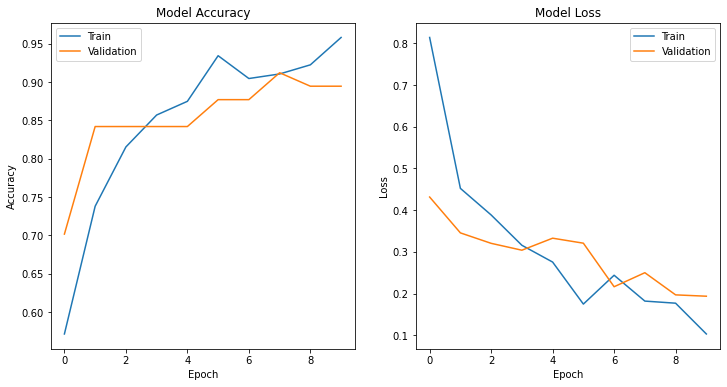

In [43]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(model_training_history.history['accuracy'])
plt.plot(model_training_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(model_training_history.history['loss'])
plt.plot(model_training_history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.show()


In [27]:
predictions = model.predict(features_test)

3/3 [==============================] - 2s 459ms/step


In [28]:
import matplotlib.pyplot as plt

def plot_metric(Model_MIM, metric_name_1, metric_name_2, plot_name, x_label, y_label, file_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
      Model_MIM: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric (training accuracy) that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
        x_label:                The label for the x-axis.
        y_label:                The label for the y-axis.
        file_name:              The name of the file to save the plot.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = Model_MIM.history[metric_name_1]
    metric_value_2 = Model_MIM.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label=f'{metric_name_1} (Training)')
    plt.plot(epochs, metric_value_2, 'red', label=f'{metric_name_2} (Validation)')
 
    # Add title to the plot.
#     plt.title(str(plot_name))
 
    # Add labels to the axes.
    plt.xlabel(x_label)
    plt.ylabel(y_label)
 
    # Add legend to the plot.
    plt.legend()
    
    # Highlight accuracy greater than 80% with a dashed line.
    plt.axhline(y=0.8, color='gray', linestyle='--', label='Accuracy > 80%')
    
    # Add small grid lines for a refined appearance.
    plt.grid(True, linestyle=':', linewidth=0.5, color='black')
 
    # Save the plot as an .eps file.
#     plt.savefig(file_name, format='eps')
    plt.show()

# Example Usage:
# Assuming history is your training history object
# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

# plot_metric(history, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

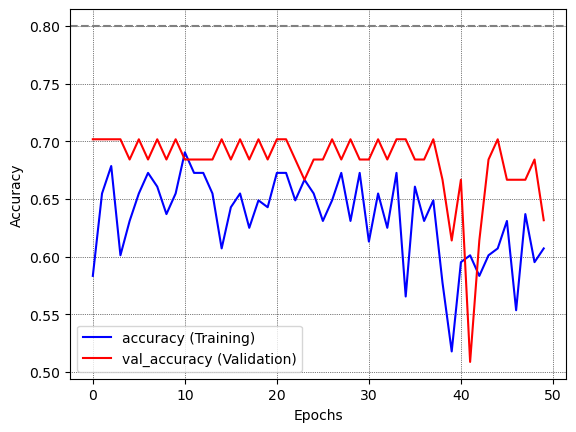

In [29]:
plot_metric(Model_MIM, 'accuracy', 'val_accuracy', 'Model Accuracy Over Epochs', 'Epochs', 'Accuracy', 'accuracy_plot.eps')

In [45]:
# Convert predicted probabilities to class labels (argmax)
#predicted_labels_MIM = np.argmax(predictions,axis=1)

# Convert true labels to class labels (argmax)
#true_labels_MIM = np.argmax(true_labels)

# Calculate accuracy by comparing predicted labels to true labels
#correct_predictions_MIM = np.sum(predicted_labels_MIM == true_labels_MIM)
#total_samples_MIM = len(true_labels)
#accuracy_MIM = correct_predictions_MIM / total_samples_MIM

# Print the accuracy
#print(f"Accuracy of MIM Model: {accuracy_MIM * 100:.2f}%")

In [52]:
# Calculate Accuracy On Test Dataset
acc_MIM = 0
for i in range(len(features_test)):
  predicted_label_MIM = np.argmax(model.predict(np.expand_dims(features_test[i],axis =0))[0])
  actual_label_MIM = np.argmax(labels_test[i])
  if predicted_label_MIM == actual_label_MIM:
      acc_MIM += 1
acc_MIM = (acc_MIM * 100)/len(labels_test)
print("Accuracy of the MIM model =",acc_MIM)

1/1 [==============================] - 0s 48ms/step
Accuracy of the MIM model = 60.0


In [53]:
# Initialize variables to store true and predicted labels
true_labels_MIM = []
predicted_labels_MIM = []

# Assuming you have features_test and labels_test
for i in range(len(features_test)):
    predicted_label_MIM = np.argmax(model.predict(np.expand_dims(features_test[i], axis=0))[0])
    actual_label_MIM = np.argmax(labels_test[i])
    
    # Append true and predicted labels to their respective lists
    true_labels_MIM.append(actual_label_MIM)
    predicted_labels_MIM.append(predicted_label_MIM)

# Calculate the confusion matrix
confusion_mtx_MIM = confusion_matrix(true_labels_MIM, predicted_labels_MIM)

# Print the confusion matrix
print("Confusion Matrix of MIM model:")
print(confusion_mtx_MIM)

1/1 [==============================] - 0s 40ms/step
Confusion Matrix of MIM model:
[[24  0  0]
 [ 2 21  0]
 [28  0  0]]


In [48]:
# Generate the classification report
classification_rep_MIM = classification_report(true_labels_MIM, predicted_labels_MIM)

# Print the classification report
print("Classification Report of MIM Model:")
print(classification_rep_MIM)

Classification Report of MIM Model:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        24
           1       1.00      1.00      1.00        23
           2       0.54      1.00      0.70        28

    accuracy                           0.68        75
   macro avg       0.51      0.67      0.57        75
weighted avg       0.51      0.68      0.57        75



In [54]:
# Calculate metrics
mcc_MIM = matthews_corrcoef(true_labels_MIM, predicted_labels_MIM)
accuracy_MIM = accuracy_score(true_labels_MIM, predicted_labels_MIM)
precision_MIM = precision_score(true_labels_MIM, predicted_labels_MIM, average='weighted')
roc_auc_MIM = roc_auc_score(labels_test, model.predict(features_test), average='weighted', multi_class='ovr')
f1_MIM = f1_score(true_labels_MIM, predicted_labels_MIM, average='weighted')

# Print the metrics
print("Matthews Correlation Coefficient (MCC) of MIM Model:", mcc_MIM)
print("Accuracy of MIM Model:", accuracy_MIM)
print("Precision of MIM Model:", precision_MIM)
print("ROC AUC of MIM Model:", roc_auc_MIM)
print("F1 Score of MIM Model:", f1_MIM)

3/3 [==============================] - 2s 458ms/step
Matthews Correlation Coefficient (MCC) of MIM Model: 0.5482869739085473
Accuracy of MIM Model: 0.6
Precision of MIM Model: 0.44888888888888884
ROC AUC of MIM Model: 0.8030621610346266
F1 Score of MIM Model: 0.4896503496503496


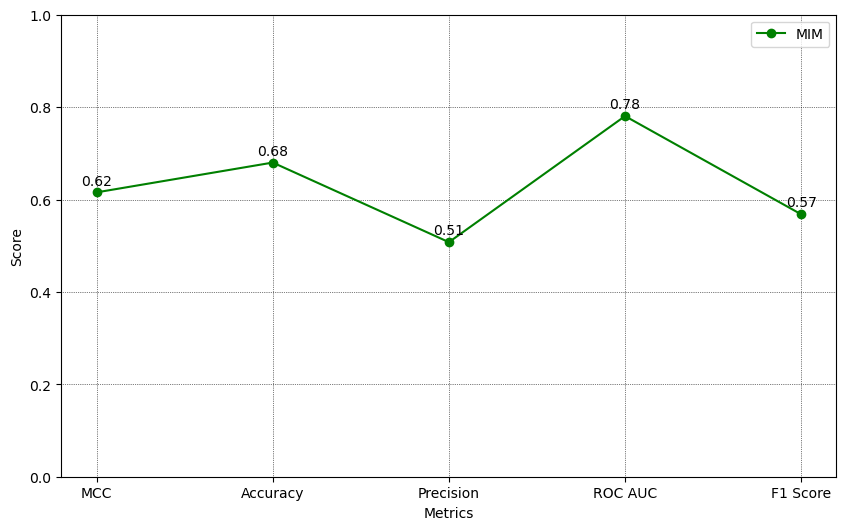

In [59]:
import matplotlib.pyplot as plt

# Metrics values
metrics_values = [0.615508, 0.68 ,0.507692, 0.780598, 0.568]
metric_names = ["MCC", "Accuracy", "Precision", "ROC AUC", "F1 Score"]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(metric_names, metrics_values, marker='o', linestyle='-', color='g', label='MIM')
#plt.title("Performance Metrics of VGG-16 model with LSTM")
plt.xlabel("Metrics")
plt.ylabel("Score")
plt.ylim(0, 1)  # Assuming scores are in the range [0, 1]

# Display the values on the points
for i, value in enumerate(metrics_values):
    plt.text(i, value + 0.01, f"{value:.2f}", ha='center', va='bottom')

# Add grid to the plot
plt.grid(True, linestyle=':', linewidth=0.5, color='black')
plt.legend()

# Save the plot in PNG format with DPI 300
plt.savefig('performance_metrics_plot_MIM.png', format='png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [49]:
# Calculate metrics
mcc_MIM = matthews_corrcoef(true_labels_MIM, predicted_labels_MIM)
accuracy_MIM = accuracy_score(true_labels_MIM, predicted_labels_MIM)
precision_MIM = precision_score(true_labels_MIM, predicted_labels_MIM, average='weighted')
roc_auc_MIM = roc_auc_score(labels_test, model.predict(features_test), average='weighted', multi_class='ovr')
f1_MIM = f1_score(true_labels_MIM, predicted_labels_MIM, average='weighted')

# Print the metrics
print("Matthews Correlation Coefficient (MCC) of MIM Model:", mcc_MIM)
print("Accuracy of MIM Model:", accuracy_MIM)
print("Precision of MIM Model:", precision_MIM)
print("ROC AUC of MIM Model:", roc_auc_MIM)
print("F1 Score of MIM Model:", f1_MIM)

Matthews Correlation Coefficient (MCC) of MIM Model: 0.6155081411191006
Accuracy of MIM Model: 0.68
Precision of MIM Model: 0.5076923076923078
ROC AUC of MIM Model: 0.7805979696843277
F1 Score of MIM Model: 0.5680000000000001


In [50]:
import pandas as pd
# creating a Dataframe
data = {'MCC':[mcc_LRCN, mcc_VGG_LSTM,mcc_MIM],'F1 score':[f1_LRCN,f1_VGG_LSTM,f1_MIM], 
        'Accuracy':[accuracy_LRCN,accuracy_VGG_LSTM,accuracy_MIM],'Precision':[precision_LRCN,precision_VGG_LSTM,precision_MIM],
          'ROC_AUC':[roc_auc_LRCN,roc_auc_VGG_LSTM,roc_auc_MIM]}
table = pd.DataFrame(data, index =['Long-term-Recurrent-Convolutional-Network','VGG-16 with LSTM Model','Motion Influence Map'])
table.T

,Long-term-Recurrent-Convolutional-Network,VGG-16 with LSTM Model,Motion Influence Map
MCC,0.821878,0.779620,0.615508
F1 score,0.880133,0.853497,0.568000
Accuracy,0.880000,0.853333,0.680000
Precision,0.884089,0.854064,0.507692
ROC_AUC,0.967031,0.959071,0.780598


# Opticle flow of Walking as non suspicious action 

In [52]:
import cv2
# Initialize video capture
cap = cv2.VideoCapture('walking(non_suspicious).mp4')  
# Parameters for optical flow
lk_params = dict(winSize=(15, 15),
                 maxLevel=2,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Initialize some random colors for visualization
color = np.random.randint(0, 255, (100, 3))

# Read the first frame
ret, prev_frame = cap.read()
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

# Create an empty mask
mask = np.zeros_like(prev_frame)

while True:
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Calculate optical flow
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    # Compute the magnitude and angle of the optical flow
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Set image hue according to the optical flow direction
    mask[..., 0] = angle * 180 / np.pi / 2

    # Set image value according to the optical flow magnitude
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Convert HSV to BGR
    flow_color = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)

    # Display the frame with optical flow visualization
    cv2.imshow('Optical Flow', flow_color)

    # Update previous frame and previous gray image
    prev_gray = gray

    # Press 'q' to exit the loop
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

# Release video capture and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()

# Opticle flow of Fighting as Suspicious actions

In [55]:
import cv2
# Initialize video capture
cap = cv2.VideoCapture('Fighting(suspicious).mp4')  
# Parameters for optical flow
lk_params = dict(winSize=(15, 15),
                 maxLevel=2,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))
 
# Initialize some random colors for visualization
color = np.random.randint(0, 255, (100, 3))

# Read the first frame
ret, prev_frame = cap.read()
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

# Create an empty mask
mask = np.zeros_like(prev_frame)

while True:
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Calculate optical flow
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    # Compute the magnitude and angle of the optical flow
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Set image hue according to the optical flow direction
    mask[..., 0] = angle * 180 / np.pi / 2

    # Set image value according to the optical flow magnitude
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Convert HSV to BGR
    flow_color = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)

    # Display the frame with optical flow visualization
    cv2.imshow('Optical Flow', flow_color)

    # Update previous frame and previous gray image
    prev_gray = gray

    # Press 'q' to exit the loop
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

# Release video capture and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()

# Prediction of Model

In [58]:
from tensorflow.keras.models import load_model
import cv2
import numpy as np
import pandas as pd
from collections import deque
from moviepy.editor import *

In [82]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
 
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 30
 
# Specify the directory containing the UCF50 dataset. 
DATASET_DIR = "Dataset"
 
# Specify the list containing the names of the classes used for training.
#CLASSES_LIST = ["walking-non_suspicious", "fight-suspicious", "running-non_suspicious"]
CLASSES_LIST = ["non_suspicious", "suspicious","non-suspicious"]

In [70]:
classes = ["walking", "running", "fighting"]
class_labels = {
    "walking": 0,
    "running": 0,  # Non-suspicious
    "fighting": 1  # Suspicious
}

# Convert your true labels to numerical labels
true_labels = ["walking", "running", "fighting", "fighting", "walking"]
numeric_labels = [class_labels[label] for label in true_labels]

# Print the numeric labels
print(numeric_labels)

[0, 0, 1, 1, 0]


In [71]:
model = load_model("Suspicious_Action Detection_in_crowds_using_AI_Driven_UAS_LRCN_Model.h5")

# Prediction of Single Action

In [83]:
def predict_single_action(video_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform single action recognition prediction on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Read a frame.
        success, frame = video_reader.read() 

        # Check if frame is not read properly then break the loop.
        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted action along with the prediction confidence.
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    # Release the VideoCapture object. 
    video_reader.release()

In [103]:
predict_single_action("running(non-suspicious).avi",SEQUENCE_LENGTH)

Action Predicted: non-suspicious
Confidence: 0.9927202463150024


In [104]:
predict_single_action("Fighting(suspicious).mp4",SEQUENCE_LENGTH)

Action Predicted: suspicious
Confidence: 0.9903265833854675


In [105]:
predict_single_action("walking.avi",SEQUENCE_LENGTH)

Action Predicted: non_suspicious
Confidence: 0.9821212291717529


# predict on video

In [87]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform action recognition on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    output_file_path: The path where the ouput video with the predicted action being performed overlayed will be stored.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Initialize the VideoWriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc(*'DIVX'), 
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        # Read the frame.
        ok, frame = video_reader.read() 
        
        # Check if frame is not read properly then break the loop.
        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]

        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)
        
    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()

In [102]:
%%time
predict_on_video("final_prediction.mp4","suspicious action detection.avi",SEQUENCE_LENGTH)

Wall time: 55.5 s


In [106]:
VideoFileClip("suspicious action detection.avi", audio=False).ipython_display()

t:   0%|          | 3/627 [00:00<00:23, 26.80it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


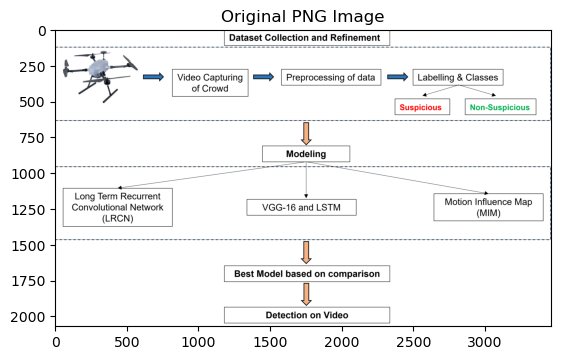

<Figure size 640x480 with 0 Axes>

In [1]:
from PIL import Image
import matplotlib.pyplot as plt

# Open the image from local PC in PNG format
image_path = 'C:/Users/armag/Pictures/framework.png'  # Provide the actual path to your PNG image
image = Image.open(image_path)

# Display the PNG image
plt.imshow(image)
plt.title('Original PNG Image')
plt.show()

# Save the image in EPS format
eps_path = 'C:/Users/armag/Pictures/framework.eps'  # Provide the desired path to save the EPS image
plt.savefig('framework.eps', format='eps',dpi=300, bbox_inches='tight')
plt.show()

In [2]:
image_path = 'C:/Users/armag/Pictures/framework.eps'  # Provide the actual path to your PNG image
image = Image.open(image_path)
plt.show()

In [2]:

from PIL import Image

def convert_png_to_eps(input_path, output_path):
    # Open the PNG image
    with Image.open(input_path) as img:
        # Convert and save as EPS
        img.save(output_path, format='EPS')

# Example usage
input_image_path = 'C:/Users/armag/Pictures/framework.png'
output_eps_path = 'C:/Users/armag/Pictures/framework.eps'

convert_png_to_eps(input_image_path, output_eps_path)


ValueError: image mode is not supported

In [5]:
from PIL import Image

def convert_png_to_eps(input_path, output_path):
    # Open the PNG image
    with Image.open(input_path) as img:
        # Convert to RGB mode (or another mode that suits your needs)
        img = img.convert('RGB')
        
        # Save as EPS
        img.save(output_path, format='EPS')

# Example usage
input_image_path = 'C:/Users/armag/Pictures/framework.png'
output_eps_path = 'C:/Users/armag/Pictures/framework.eps'

convert_png_to_eps(input_image_path, output_eps_path)

In [4]:
import matplotlib.pyplot as plt
from matplotlib.cbook import get_sample_data

# Load the EPS file
eps_file_path = 'C:/Users/armag/Pictures/framework.eps'

# Display the EPS file
with get_sample_data(eps_file_path) as file:
    image = plt.imread(file)
    plt.imshow(image)
    plt.show()


OSError: Unable to locate Ghostscript on paths